# <center><font color = '#DF9166' size = 20 center> **User Overview Analysis**</font></center>




## <font color = '#DF9166' size=6>**Table of content**<font/><a class = 'anchor' id = 'introduction'/>

1. [**Import Libraries**](#import)
2. [**Data Loading**](#data_loading)
3. [**Data Inspection**](#data_inspection)
4. [**Data Preprocessing**](#data_preprocessing)
5. [**Handset and Manufacturer Analysis**](#handset_analysis)
6. [**User Behavior Analysis**](#user_behavior)
7. [**Exploratory Data Analysis (EDA)**](#eda)

## <font color = '#DF9166' size=6>**Import Libraries**<font/><a class = 'anchor' id = 'import'/>


In [59]:
import sys
import os

sys.path.append(os.path.abspath(os.path.pardir))

In [60]:
import warnings
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import zscore
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import StandardScaler
from IPython.display import clear_output
from sklearn.decomposition import PCA

In [61]:
from src.utils.connect_db import *
from src.utils.plot import generate_hist_box_plots
from src.utils.data_preprocessor import handle_outliers
from src.utils.plot import plot_boxplot

In [62]:
warnings.filterwarnings('ignore')

In [63]:
sns.set_style("whitegrid")

In [64]:
pd.set_option("display.max_colwidth", None)
pd.set_option('display.max_columns', None)

## <font color = '#DF9166' size=6>**Data Loading**<font/><a class = 'anchor' id = 'data_loading'/>

In [65]:
query = "SELECT * FROM public.xdr_data"

df = fetch_data_from_db(query)
df.head(2)

,Bearer Id,Start,Start ms,End,End ms,Dur. (ms),IMSI,MSISDN/Number,IMEI,Last Location Name,Avg RTT DL (ms),Avg RTT UL (ms),Avg Bearer TP DL (kbps),Avg Bearer TP UL (kbps),TCP DL Retrans. Vol (Bytes),TCP UL Retrans. Vol (Bytes),DL TP < 50 Kbps (%),50 Kbps < DL TP < 250 Kbps (%),250 Kbps < DL TP < 1 Mbps (%),DL TP > 1 Mbps (%),UL TP < 10 Kbps (%),10 Kbps < UL TP < 50 Kbps (%),50 Kbps < UL TP < 300 Kbps (%),UL TP > 300 Kbps (%),HTTP DL (Bytes),HTTP UL (Bytes),Activity Duration DL (ms),Activity Duration UL (ms),Dur. (ms).1,Handset Manufacturer,Handset Type,Nb of sec with 125000B < Vol DL,Nb of sec with 1250B < Vol UL < 6250B,Nb of sec with 31250B < Vol DL < 125000B,Nb of sec with 37500B < Vol UL,Nb of sec with 6250B < Vol DL < 31250B,Nb of sec with 6250B < Vol UL < 37500B,Nb of sec with Vol DL < 6250B,Nb of sec with Vol UL < 1250B,Social Media DL (Bytes),Social Media UL (Bytes),Google DL (Bytes),Google UL (Bytes),Email DL (Bytes),Email UL (Bytes),Youtube DL (Bytes),Youtube UL (Bytes),Netflix DL (Bytes),Netflix UL (Bytes),Gaming DL (Bytes),Gaming UL (Bytes),Other DL (Bytes),Other UL (Bytes),Total UL (Bytes),Total DL (Bytes)
0,1.311448e+19,4/4/2019 12:01,770.0,4/25/2019 14:35,662.0,1823652.0,2.082014e+14,3.366496e+10,3.552121e+13,9.16456699548519E+015,42.0,5.0,23.0,44.0,NaN,NaN,100.0,0.0,0.0,0.0,100.0,0.0,0.0,0.0,NaN,NaN,37624.0,38787.0,1.823653e+09,Samsung,Samsung Galaxy A5 Sm-A520F,NaN,NaN,NaN,NaN,NaN,NaN,213.0,214.0,1545765.0,24420.0,1634479.0,1271433.0,3563542.0,137762.0,15854611.0,2501332.0,8198936.0,9656251.0,278082303.0,14344150.0,171744450.0,8814393.0,36749741.0,308879636.0
1,1.311448e+19,4/9/2019 13:04,235.0,4/25/2019 8:15,606.0,1365104.0,2.082019e+14,3.368185e+10,3.579401e+13,L77566A,65.0,5.0,16.0,26.0,NaN,NaN,100.0,0.0,0.0,0.0,100.0,0.0,0.0,0.0,NaN,NaN,168.0,3560.0,1.365104e+09,Samsung,Samsung Galaxy J5 (Sm-J530),NaN,NaN,NaN,NaN,NaN,NaN,971.0,1022.0,1926113.0,7165.0,3493924.0,920172.0,629046.0,308339.0,20247395.0,19111729.0,18338413.0,17227132.0,608750074.0,1170709.0,526904238.0,15055145.0,53800391.0,653384965.0


## <font color = '#DF9166' size=6>**Data Inspection**<font/><a class = 'anchor' id = 'data_inspection'/>

In [66]:
print(f"Shape of the Dataset: {df.shape}")

Shape of the Dataset: (150001, 55)


In [67]:
print("Dataset Info:\n")
df.info()

Dataset Info:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150001 entries, 0 to 150000
Data columns (total 55 columns):
 #   Column                                    Non-Null Count   Dtype  
---  ------                                    --------------   -----  
 0   Bearer Id                                 149010 non-null  float64
 1   Start                                     150000 non-null  object 
 2   Start ms                                  150000 non-null  float64
 3   End                                       150000 non-null  object 
 4   End ms                                    150000 non-null  float64
 5   Dur. (ms)                                 150000 non-null  float64
 6   IMSI                                      149431 non-null  float64
 7   MSISDN/Number                             148935 non-null  float64
 8   IMEI                                      149429 non-null  float64
 9   Last Location Name                        148848 non-null  object 
 10  Avg R

In [68]:
print("Number of Unique Values in Each Column:\n")
for col in df.columns:
    print(f"{col:>45}: {df[col].nunique()} unique values")

Number of Unique Values in Each Column:

                                    Bearer Id: 134708 unique values
                                        Start: 9997 unique values
                                     Start ms: 1000 unique values
                                          End: 6403 unique values
                                       End ms: 1000 unique values
                                    Dur. (ms): 89525 unique values
                                         IMSI: 107265 unique values
                                MSISDN/Number: 106856 unique values
                                         IMEI: 107270 unique values
                           Last Location Name: 45547 unique values
                              Avg RTT DL (ms): 2130 unique values
                              Avg RTT UL (ms): 722 unique values
                      Avg Bearer TP DL (kbps): 41753 unique values
                      Avg Bearer TP UL (kbps): 14528 unique values
                  TCP DL

In [69]:
CATEGORICAL_COLUMNS = [
    "Bearer Id",
    "IMSI",
    "MSISDN/Number",
    "IMEI",
    "Last Location Name",
    "Handset Manufacturer",
    "Handset Type",
    'Start', 
    'End'
]

NUMERICAL_COLUMNS = [
    "Start ms",
    "End ms",
    "Dur. (ms)",
    "Avg RTT DL (ms)",
    "Avg RTT UL (ms)",
    "Avg Bearer TP DL (kbps)",
    "Avg Bearer TP UL (kbps)",
    "TCP DL Retrans. Vol (Bytes)",
    "TCP UL Retrans. Vol (Bytes)",
    "DL TP < 50 Kbps (%)",
    "50 Kbps < DL TP < 250 Kbps (%)",
    "250 Kbps < DL TP < 1 Mbps (%)",
    "DL TP > 1 Mbps (%)",
    "UL TP < 10 Kbps (%)",
    "10 Kbps < UL TP < 50 Kbps (%)",
    "50 Kbps < UL TP < 300 Kbps (%)",
    "UL TP > 300 Kbps (%)",
    "HTTP DL (Bytes)",
    "HTTP UL (Bytes)",
    "Activity Duration DL (ms)",
    "Activity Duration UL (ms)",
    "Dur. (ms).1",
    "Nb of sec with 125000B < Vol DL",
    "Nb of sec with 1250B < Vol UL < 6250B",
    "Nb of sec with 31250B < Vol DL < 125000B",
    "Nb of sec with 37500B < Vol UL",
    "Nb of sec with 6250B < Vol DL < 31250B",
    "Nb of sec with 6250B < Vol UL < 37500B",
    "Nb of sec with Vol DL < 6250B",
    "Nb of sec with Vol UL < 1250B",
    "Social Media DL (Bytes)",
    "Social Media UL (Bytes)",
    "Google DL (Bytes)",
    "Google UL (Bytes)",
    "Email DL (Bytes)",
    "Email UL (Bytes)",
    "Youtube DL (Bytes)",
    "Youtube UL (Bytes)",
    "Netflix DL (Bytes)",
    "Netflix UL (Bytes)",
    "Gaming DL (Bytes)",
    "Gaming UL (Bytes)",
    "Other DL (Bytes)",
    "Other UL (Bytes)",
    "Total UL (Bytes)",
    "Total DL (Bytes)",
]

In [70]:
df[CATEGORICAL_COLUMNS].head(2)

,Bearer Id,IMSI,MSISDN/Number,IMEI,Last Location Name,Handset Manufacturer,Handset Type,Start,End
0,1.311448e+19,2.082014e+14,3.366496e+10,3.552121e+13,9.16456699548519E+015,Samsung,Samsung Galaxy A5 Sm-A520F,4/4/2019 12:01,4/25/2019 14:35
1,1.311448e+19,2.082019e+14,3.368185e+10,3.579401e+13,L77566A,Samsung,Samsung Galaxy J5 (Sm-J530),4/9/2019 13:04,4/25/2019 8:15


In [71]:
df[CATEGORICAL_COLUMNS].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150001 entries, 0 to 150000
Data columns (total 9 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Bearer Id             149010 non-null  float64
 1   IMSI                  149431 non-null  float64
 2   MSISDN/Number         148935 non-null  float64
 3   IMEI                  149429 non-null  float64
 4   Last Location Name    148848 non-null  object 
 5   Handset Manufacturer  149429 non-null  object 
 6   Handset Type          149429 non-null  object 
 7   Start                 150000 non-null  object 
 8   End                   150000 non-null  object 
dtypes: float64(4), object(5)
memory usage: 10.3+ MB


In the dataset, columns like Bearer Id, IMSI, MSISDN/Number, and IMEI are currently represented as float64, which is a numerical data type. However, these columns represent categorical identifiers, not continuous or numerical values. It should be converted to Object type. To ensure the floating-point numbers are converted to string format without being represented in scientific notation or losing precision, you can first convert them to integers, then to strings.

In [72]:
# Apply formatting to remove scientific notation and ensure integer representation as strings
for col in CATEGORICAL_COLUMNS:
    df[col] = df[col].apply(
        lambda x: (
            "{:.0f}".format(float(x))
            if isinstance(x, (int, float)) and not pd.isna(x)
            else str(x) if not pd.isna(x) else None
        )
    )

In [73]:
print("Information about Categorical Columns in the DataFrame:\n")
df[CATEGORICAL_COLUMNS].info()

Information about Categorical Columns in the DataFrame:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150001 entries, 0 to 150000
Data columns (total 9 columns):
 #   Column                Non-Null Count   Dtype 
---  ------                --------------   ----- 
 0   Bearer Id             149010 non-null  object
 1   IMSI                  149431 non-null  object
 2   MSISDN/Number         148935 non-null  object
 3   IMEI                  149429 non-null  object
 4   Last Location Name    148848 non-null  object
 5   Handset Manufacturer  149429 non-null  object
 6   Handset Type          149429 non-null  object
 7   Start                 150000 non-null  object
 8   End                   150000 non-null  object
dtypes: object(9)
memory usage: 10.3+ MB


In [74]:
print("Displaying the first 2 rows of the categorical columns in the DataFrame:\n")
df[CATEGORICAL_COLUMNS].head(4)

Displaying the first 2 rows of the categorical columns in the DataFrame:



,Bearer Id,IMSI,MSISDN/Number,IMEI,Last Location Name,Handset Manufacturer,Handset Type,Start,End
0,13114483460844900352,208201448079117,33664962239,35521209507511,9.16456699548519E+015,Samsung,Samsung Galaxy A5 Sm-A520F,4/4/2019 12:01,4/25/2019 14:35
1,13114483482878900224,208201909211140,33681854413,35794009006359,L77566A,Samsung,Samsung Galaxy J5 (Sm-J530),4/9/2019 13:04,4/25/2019 8:15
2,13114483484080500736,208200314458056,33760627129,35281510359387,D42335A,Samsung,Samsung Galaxy A8 (2018),4/9/2019 17:42,4/25/2019 11:58
3,13114483485442799616,208201402342131,33750343200,35356610164913,T21824A,undefined,undefined,4/10/2019 0:31,4/25/2019 7:36


In [75]:
# Descriptive statistics for categorical columns
print("Descriptive Statistics for Categorical Columns:\n")
df[CATEGORICAL_COLUMNS].astype(str).describe(include='all')

Descriptive Statistics for Categorical Columns:



,Bearer Id,IMSI,MSISDN/Number,IMEI,Last Location Name,Handset Manufacturer,Handset Type,Start,End
count,150001,150001,150001,150001,150001,150001,150001,150001,150001
unique,134709,107266,106857,107271,45548,171,1397,9998,6404
top,None,None,None,None,None,Apple,Huawei B528S-23A,4/26/2019 7:25,4/25/2019 0:01
freq,991,570,1066,572,1153,59565,19752,203,1150


In [76]:
print("Displaying the first 2 rows of the numerical columns in the DataFrame:\n")
df[NUMERICAL_COLUMNS].head(2)

Displaying the first 2 rows of the numerical columns in the DataFrame:



,Start ms,End ms,Dur. (ms),Avg RTT DL (ms),Avg RTT UL (ms),Avg Bearer TP DL (kbps),Avg Bearer TP UL (kbps),TCP DL Retrans. Vol (Bytes),TCP UL Retrans. Vol (Bytes),DL TP < 50 Kbps (%),50 Kbps < DL TP < 250 Kbps (%),250 Kbps < DL TP < 1 Mbps (%),DL TP > 1 Mbps (%),UL TP < 10 Kbps (%),10 Kbps < UL TP < 50 Kbps (%),50 Kbps < UL TP < 300 Kbps (%),UL TP > 300 Kbps (%),HTTP DL (Bytes),HTTP UL (Bytes),Activity Duration DL (ms),Activity Duration UL (ms),Dur. (ms).1,Nb of sec with 125000B < Vol DL,Nb of sec with 1250B < Vol UL < 6250B,Nb of sec with 31250B < Vol DL < 125000B,Nb of sec with 37500B < Vol UL,Nb of sec with 6250B < Vol DL < 31250B,Nb of sec with 6250B < Vol UL < 37500B,Nb of sec with Vol DL < 6250B,Nb of sec with Vol UL < 1250B,Social Media DL (Bytes),Social Media UL (Bytes),Google DL (Bytes),Google UL (Bytes),Email DL (Bytes),Email UL (Bytes),Youtube DL (Bytes),Youtube UL (Bytes),Netflix DL (Bytes),Netflix UL (Bytes),Gaming DL (Bytes),Gaming UL (Bytes),Other DL (Bytes),Other UL (Bytes),Total UL (Bytes),Total DL (Bytes)
0,770.0,662.0,1823652.0,42.0,5.0,23.0,44.0,NaN,NaN,100.0,0.0,0.0,0.0,100.0,0.0,0.0,0.0,NaN,NaN,37624.0,38787.0,1.823653e+09,NaN,NaN,NaN,NaN,NaN,NaN,213.0,214.0,1545765.0,24420.0,1634479.0,1271433.0,3563542.0,137762.0,15854611.0,2501332.0,8198936.0,9656251.0,278082303.0,14344150.0,171744450.0,8814393.0,36749741.0,308879636.0
1,235.0,606.0,1365104.0,65.0,5.0,16.0,26.0,NaN,NaN,100.0,0.0,0.0,0.0,100.0,0.0,0.0,0.0,NaN,NaN,168.0,3560.0,1.365104e+09,NaN,NaN,NaN,NaN,NaN,NaN,971.0,1022.0,1926113.0,7165.0,3493924.0,920172.0,629046.0,308339.0,20247395.0,19111729.0,18338413.0,17227132.0,608750074.0,1170709.0,526904238.0,15055145.0,53800391.0,653384965.0


In [77]:
print("Information about Numerical Columns in the DataFrame:\n")
df[NUMERICAL_COLUMNS].info()

Information about Numerical Columns in the DataFrame:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150001 entries, 0 to 150000
Data columns (total 46 columns):
 #   Column                                    Non-Null Count   Dtype  
---  ------                                    --------------   -----  
 0   Start ms                                  150000 non-null  float64
 1   End ms                                    150000 non-null  float64
 2   Dur. (ms)                                 150000 non-null  float64
 3   Avg RTT DL (ms)                           122172 non-null  float64
 4   Avg RTT UL (ms)                           122189 non-null  float64
 5   Avg Bearer TP DL (kbps)                   150000 non-null  float64
 6   Avg Bearer TP UL (kbps)                   150000 non-null  float64
 7   TCP DL Retrans. Vol (Bytes)               61855 non-null   float64
 8   TCP UL Retrans. Vol (Bytes)               53352 non-null   float64
 9   DL TP < 50 Kbps (%)                  

In [78]:
# Descriptive statistics for categorical columns
print("Descriptive Statistics for Numerical Columns:\n")
df[NUMERICAL_COLUMNS].astype(str).describe(include='all')

Descriptive Statistics for Numerical Columns:



,Start ms,End ms,Dur. (ms),Avg RTT DL (ms),Avg RTT UL (ms),Avg Bearer TP DL (kbps),Avg Bearer TP UL (kbps),TCP DL Retrans. Vol (Bytes),TCP UL Retrans. Vol (Bytes),DL TP < 50 Kbps (%),50 Kbps < DL TP < 250 Kbps (%),250 Kbps < DL TP < 1 Mbps (%),DL TP > 1 Mbps (%),UL TP < 10 Kbps (%),10 Kbps < UL TP < 50 Kbps (%),50 Kbps < UL TP < 300 Kbps (%),UL TP > 300 Kbps (%),HTTP DL (Bytes),HTTP UL (Bytes),Activity Duration DL (ms),Activity Duration UL (ms),Dur. (ms).1,Nb of sec with 125000B < Vol DL,Nb of sec with 1250B < Vol UL < 6250B,Nb of sec with 31250B < Vol DL < 125000B,Nb of sec with 37500B < Vol UL,Nb of sec with 6250B < Vol DL < 31250B,Nb of sec with 6250B < Vol UL < 37500B,Nb of sec with Vol DL < 6250B,Nb of sec with Vol UL < 1250B,Social Media DL (Bytes),Social Media UL (Bytes),Google DL (Bytes),Google UL (Bytes),Email DL (Bytes),Email UL (Bytes),Youtube DL (Bytes),Youtube UL (Bytes),Netflix DL (Bytes),Netflix UL (Bytes),Gaming DL (Bytes),Gaming UL (Bytes),Other DL (Bytes),Other UL (Bytes),Total UL (Bytes),Total DL (Bytes)
count,150001,150001,150001,150001,150001,150001,150001,150001,150001,150001,150001,150001,150001,150001,150001,150001,150001,150001,150001,150001,150001,150001,150001,150001,150001,150001,150001,150001,150001,150001,150001,150001,150001,150001,150001,150001,150001,150001,150001,150001,150001,150001,150001,150001,150001,150001
unique,1001,1001,89526,2131,723,41754,14529,54400,35121,101,85,74,86,99,86,69,64,63528,59943,102561,106293,122872,6459,3399,5756,1105,6173,1711,22271,22977,146856,59078,149024,147267,146916,138699,149547,149477,149518,149490,149983,149316,149986,149284,149729,149988
top,341.0,872.0,86399.0,nan,nan,23.0,40.0,nan,nan,100.0,0.0,0.0,0.0,100.0,0.0,0.0,0.0,nan,nan,0.0,0.0,86399953.0,nan,nan,nan,nan,nan,nan,3.0,nan,1132416.0,55156.0,6839538.0,3426526.0,1829513.0,694318.0,18869169.0,3398443.0,2097111.0,1751610.0,137736955.0,15304673.0,160563292.0,4514572.0,41954202.0,280121305.0
freq,190,213,21413,27829,27812,7324,7794,88146,96649,87044,95236,104694,112181,91663,117210,144666,146752,81474,81810,7278,5186,215,97538,92894,93586,130254,88317,111843,951,793,3,11,3,4,4,4,3,3,3,3,2,3,2,3,2,2


## <font color = '#DF9166' size=6>**Data Preprocessing**<font/><a class = 'anchor' id = 'data_preprocessing'/>


### Handling Missing Values

In [79]:
print("\nMissing Values in Each Column:")
missing_values = df.isnull().sum()
missing_values[missing_values > 0]


Missing Values in Each Column:


Bearer Id                                      991
Start                                            1
Start ms                                         1
End                                              1
End ms                                           1
Dur. (ms)                                        1
IMSI                                           570
MSISDN/Number                                 1066
IMEI                                           572
Last Location Name                            1153
Avg RTT DL (ms)                              27829
Avg RTT UL (ms)                              27812
Avg Bearer TP DL (kbps)                          1
Avg Bearer TP UL (kbps)                          1
TCP DL Retrans. Vol (Bytes)                  88146
TCP UL Retrans. Vol (Bytes)                  96649
DL TP < 50 Kbps (%)                            754
50 Kbps < DL TP < 250 Kbps (%)                 754
250 Kbps < DL TP < 1 Mbps (%)                  754
DL TP > 1 Mbps (%)             

In [80]:
columns_to_check = ["Bearer Id", "IMSI", "MSISDN/Number", "IMEI", "Last Location Name"]
df = df.dropna(subset=columns_to_check)
df.shape

(148346, 55)

In [81]:
# Replace missing values in numerical columns with the mean
df[NUMERICAL_COLUMNS] = df[NUMERICAL_COLUMNS].fillna(df[NUMERICAL_COLUMNS].mean())

In [82]:
# Replace missing values in categorical columns with the mode
for col in CATEGORICAL_COLUMNS:
	df[col].fillna(df[col].mode().iloc[0], inplace=True)

In [83]:
# Verify that missing values have been handled
missing_values_after = df.isnull().sum().sum()
print(f"Total missing values after handling: {missing_values_after}")

Total missing values after handling: 0


### Handling Outliers


In [84]:
# Replace outliers with boundaries for all numerical columns
df = handle_outliers(df, NUMERICAL_COLUMNS, plot_box=False, replace_with="mean")

In [85]:
# Check for remaining outliers using Z-Score
print("\nColumns with Potential Outliers After Z-Score Analysis:\n")
for col in NUMERICAL_COLUMNS:
    z_scores = zscore(df[col])
    outliers = (np.abs(z_scores) > 3).sum()
    print(f"{col:>45}: {outliers} potential outliers")


Columns with Potential Outliers After Z-Score Analysis:

                                     Start ms: 0 potential outliers
                                       End ms: 0 potential outliers
                                    Dur. (ms): 365 potential outliers
                              Avg RTT DL (ms): 1694 potential outliers
                              Avg RTT UL (ms): 1224 potential outliers
                      Avg Bearer TP DL (kbps): 2246 potential outliers
                      Avg Bearer TP UL (kbps): 0 potential outliers
                  TCP DL Retrans. Vol (Bytes): 336 potential outliers
                  TCP UL Retrans. Vol (Bytes): 159 potential outliers
                          DL TP < 50 Kbps (%): 3398 potential outliers
               50 Kbps < DL TP < 250 Kbps (%): 2134 potential outliers
                250 Kbps < DL TP < 1 Mbps (%): 0 potential outliers
                           DL TP > 1 Mbps (%): 0 potential outliers
                          UL TP < 10 

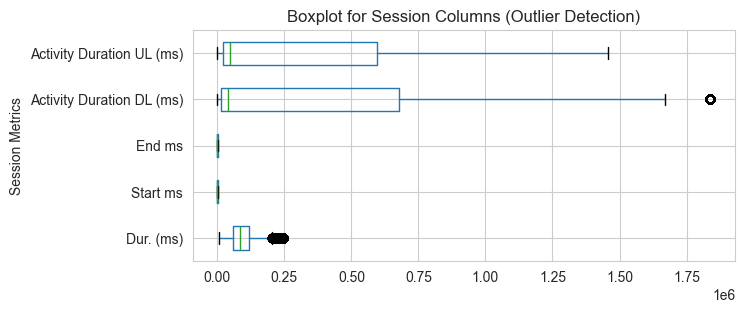

In [86]:
SESSION_COLUMNS = [
    "Dur. (ms)", "Start ms", "End ms", "Activity Duration DL (ms)", "Activity Duration UL (ms)"
]

plt.figure(figsize=(7, 3))
df[SESSION_COLUMNS].boxplot(vert=False)
plt.title("Boxplot for Session Columns (Outlier Detection)")
plt.ylabel("Session Metrics")
plt.show()

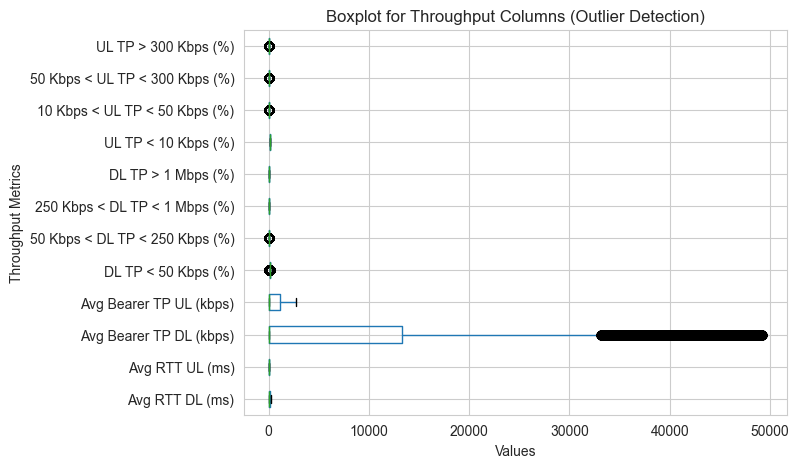

In [87]:
THROUGHPUT_COLUMNS = [
    "Avg RTT DL (ms)", "Avg RTT UL (ms)", "Avg Bearer TP DL (kbps)", "Avg Bearer TP UL (kbps)",
    "DL TP < 50 Kbps (%)", "50 Kbps < DL TP < 250 Kbps (%)", "250 Kbps < DL TP < 1 Mbps (%)",
    "DL TP > 1 Mbps (%)", "UL TP < 10 Kbps (%)", "10 Kbps < UL TP < 50 Kbps (%)",
    "50 Kbps < UL TP < 300 Kbps (%)", "UL TP > 300 Kbps (%)"
]


# Detect Outliers Using Horizontal Boxplots
plt.figure(figsize=(7, 5))
df[THROUGHPUT_COLUMNS].boxplot(vert=False)
plt.title("Boxplot for Throughput Columns (Outlier Detection)")
plt.xlabel("Values")
plt.ylabel("Throughput Metrics")
plt.show()

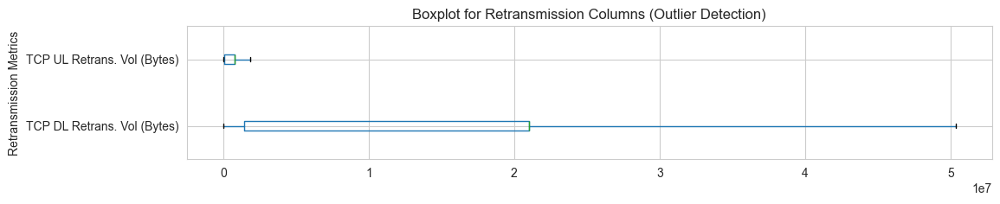

In [88]:
RETRANSMISSION_COLUMNS = ["TCP DL Retrans. Vol (Bytes)", "TCP UL Retrans. Vol (Bytes)"]

# Detect Outliers Using Boxplots
plt.figure(figsize=(12, 2))
df[RETRANSMISSION_COLUMNS].boxplot(vert=False)
plt.title("Boxplot for Retransmission Columns (Outlier Detection)")
plt.ylabel("Retransmission Metrics")
plt.show()

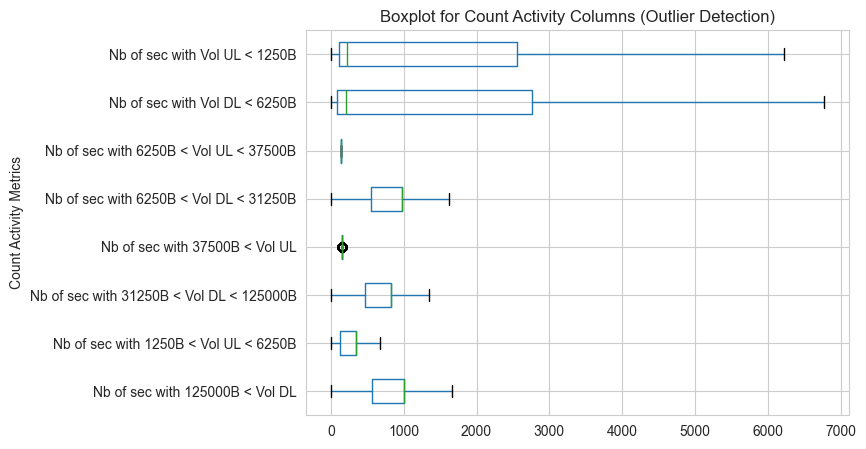

In [89]:
COUNT_ACTIVITY_COLUMNS = [
    "Nb of sec with 125000B < Vol DL", "Nb of sec with 1250B < Vol UL < 6250B",
    "Nb of sec with 31250B < Vol DL < 125000B", "Nb of sec with 37500B < Vol UL",
    "Nb of sec with 6250B < Vol DL < 31250B", "Nb of sec with 6250B < Vol UL < 37500B",
    "Nb of sec with Vol DL < 6250B", "Nb of sec with Vol UL < 1250B"
]

# Detect Outliers Using Boxplots
plt.figure(figsize=(7, 5))
df[COUNT_ACTIVITY_COLUMNS].boxplot(vert=False)
plt.title("Boxplot for Count Activity Columns (Outlier Detection)")
plt.ylabel("Count Activity Metrics")
plt.show()

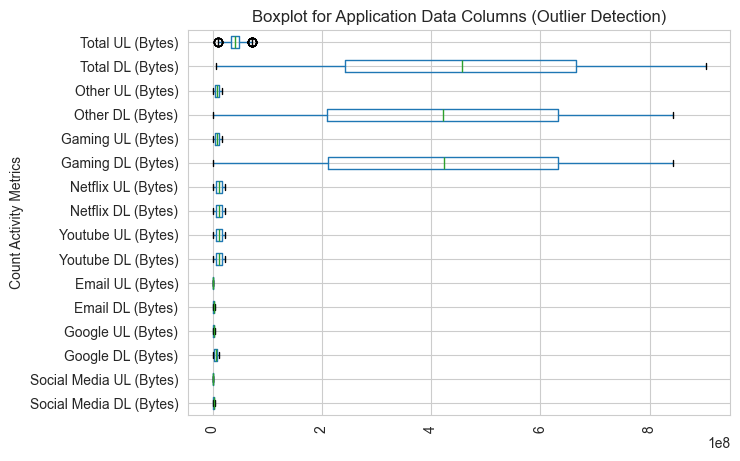

In [90]:
APPLICATION_DATA_COLUMNS = [
    "Social Media DL (Bytes)", "Social Media UL (Bytes)", "Google DL (Bytes)", "Google UL (Bytes)",
    "Email DL (Bytes)", "Email UL (Bytes)", "Youtube DL (Bytes)", "Youtube UL (Bytes)",
    "Netflix DL (Bytes)", "Netflix UL (Bytes)", "Gaming DL (Bytes)", "Gaming UL (Bytes)",
    "Other DL (Bytes)", "Other UL (Bytes)", "Total DL (Bytes)", "Total UL (Bytes)"
]

plt.figure(figsize=(7, 5))
df[APPLICATION_DATA_COLUMNS].boxplot(vert=False)
plt.title("Boxplot for Application Data Columns (Outlier Detection)")
plt.ylabel("Count Activity Metrics")

plt.xticks(rotation=90)
plt.show()

In [91]:
df.to_csv('C:/dev/Side-Projects/10 Acadamy/W2 Challenge/User Engagement and Satisfaction Analysis/data/cleaned_telecom_data.csv')

## <font color = '#DF9166' size=6>**Handset and Manufacturer Analysis**<font/><a class = 'anchor' id = 'handset_analysis'/>

In [92]:
top_10_handsets = df['Handset Type'].value_counts().shape
top_10_handsets

(1390,)

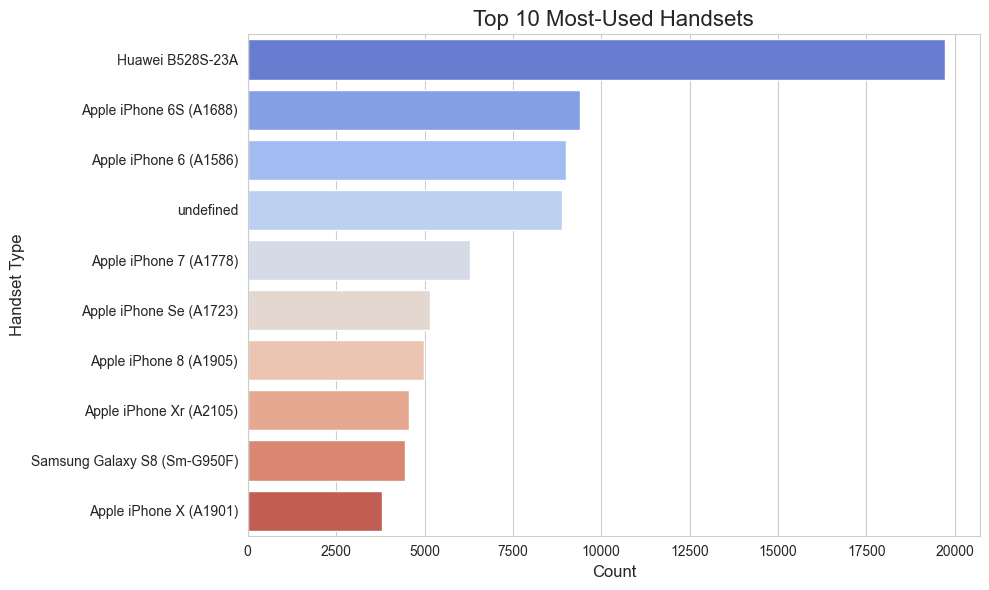

In [93]:
top_10_handsets = df['Handset Type'].value_counts().head(10)

# Convert to DataFrame for visualization
top_10_handsets_df = top_10_handsets.reset_index()
top_10_handsets_df.columns = ['Handset Type', 'Count']

# Plot the top 10 handsets
plt.figure(figsize=(10, 6))
sns.barplot(data=top_10_handsets_df, x='Count', y='Handset Type', palette='coolwarm')
plt.title('Top 10 Most-Used Handsets', fontsize=16)
plt.xlabel('Count', fontsize=12)
plt.ylabel('Handset Type', fontsize=12)
plt.tight_layout()
plt.show()


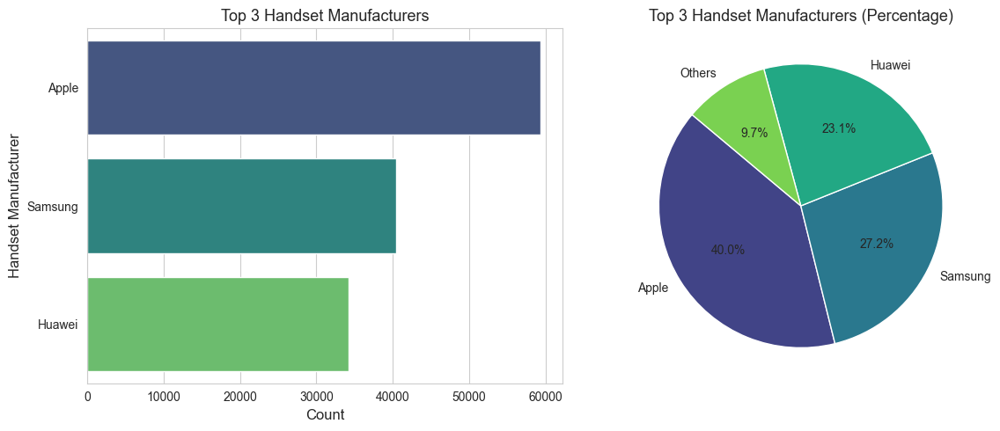

In [94]:
# Group by 'Handset Manufacturer' and count occurrences
top_3_manufacturers = df['Handset Manufacturer'].value_counts().head(3)
other_manufacturers_count = df['Handset Manufacturer'].value_counts().iloc[3:].sum()

# Add 'Others' category
top_3_manufacturers['Others'] = other_manufacturers_count

# Convert to DataFrame for visualization
top_3_manufacturers_df = top_3_manufacturers.reset_index()
top_3_manufacturers_df.columns = ['Handset Manufacturer', 'Count']

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Bar Chart Visualization
sns.barplot(data=top_3_manufacturers_df.iloc[:3], x='Count', y='Handset Manufacturer', palette='viridis', ax=axes[0])
axes[0].set_title('Top 3 Handset Manufacturers', fontsize=13)
axes[0].set_xlabel('Count', fontsize=12)
axes[0].set_ylabel('Handset Manufacturer', fontsize=12)

# Pie Chart Visualization
axes[1].pie(
    top_3_manufacturers.values,
    labels=top_3_manufacturers.index,
    autopct='%1.1f%%',
    startangle=140,
    colors=sns.color_palette('viridis', len(top_3_manufacturers))
)
axes[1].set_title('Top 3 Handset Manufacturers (Percentage)', fontsize=13)

plt.tight_layout()
plt.show()


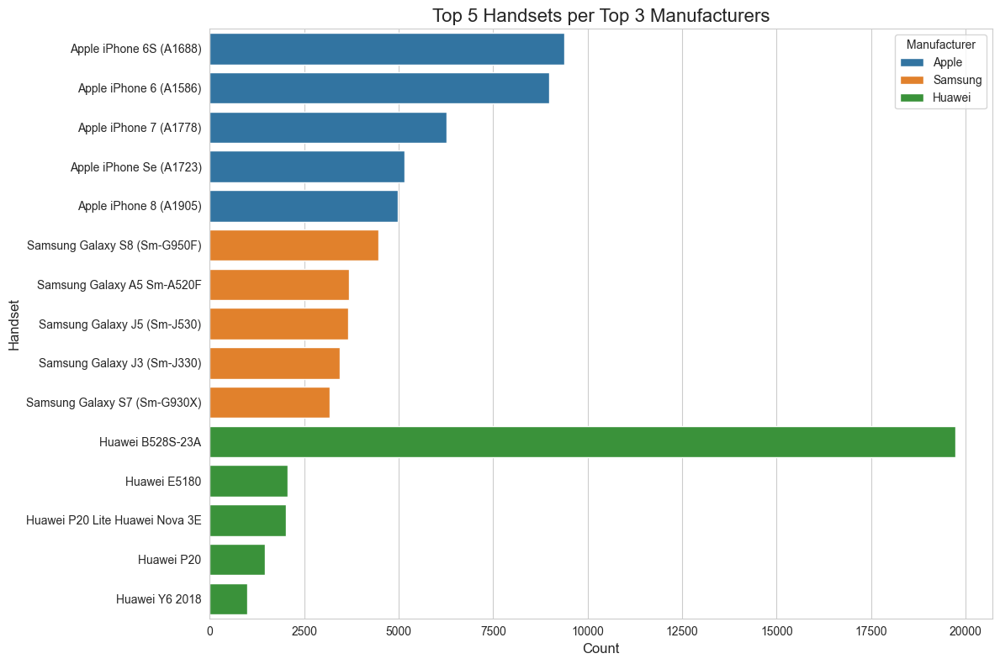

In [95]:
# Group by 'Handset Manufacturer' and get the top 3 manufacturers
top_3_manufacturers = df['Handset Manufacturer'].value_counts().head(3).index

plot_data = []
for manufacturer in top_3_manufacturers:
    top_5_handsets = df[df['Handset Manufacturer'] == manufacturer]['Handset Type'].value_counts().head(5)
    for handset, count in top_5_handsets.items():
        plot_data.append({'Manufacturer': manufacturer, 'Handset': handset, 'Count': count})

# Convert the results to a DataFrame for display
plot_df = pd.DataFrame(plot_data)

# Horizontal Bar Chart
plt.figure(figsize=(12, 8))
sns.barplot(
    data=plot_df,
    y='Handset',
    x='Count',
    hue='Manufacturer',
    palette='tab10'
)
plt.title('Top 5 Handsets per Top 3 Manufacturers', fontsize=16)
plt.xlabel('Count', fontsize=12)
plt.ylabel('Handset', fontsize=12)
plt.legend(title='Manufacturer')
plt.tight_layout()
plt.show()


### Recommendations to Marketing Teams:

- **Apple Focus**: Target iPhone 6, 6S, and 7 users with upgrade campaigns for newer models emphasizing enhanced features.  
- **Huawei Strategy**: Promote premium devices and fixed broadband services to Huawei B528S-23A users.  
- **Samsung Opportunities**: Incentivize Galaxy S8 and A5 users to upgrade to newer models with trade-in offers.  
- **Address "Undefined" Handsets**: Investigate and engage this segment with universal offers or promotions.  
- **Localized Campaigns**: Tailor promotions to geographic and demographic segments for better reach.  

## <font color = '#DF9166' size=6>**User Behavior Analysis**<font/><a class = 'anchor' id = 'user_behavior'/>

### No. of User Session

In [96]:
# Set display format for floating-point numbers as integers
pd.options.display.float_format = '{:.0f}'.format

# Group data by user and count the number of sessions
user_sessions = df.groupby('MSISDN/Number').agg(
    total_sessions=('Bearer Id', 'count')
).reset_index()

print("User sessions dataframe: \n")
user_sessions.head()

User sessions dataframe: 



,MSISDN/Number,total_sessions
0,3197020876596,1
1,33601001722,1
2,33601001754,1
3,33601002511,1
4,33601007832,1


In [97]:
# Descriptive statistics for user session
print("Descriptive Statistics for User Session:\n")
user_sessions['total_sessions'].describe()

Descriptive Statistics for User Session:



count   106352
mean         1
std          1
min          1
25%          1
50%          1
75%          2
max         18
Name: total_sessions, dtype: float64

Most users had only one session, with 75% having two or fewer sessions, indicating minimal engagement overall. A small group of high-session users suggests an opportunity to analyze and replicate their behavior to increase overall user activity.

### User Session Duration

In [98]:
# Group by user and calculate total session duration
user_sessions = df.groupby('MSISDN/Number').agg(
    total_session_duration=('Dur. (ms)', 'sum')
).reset_index()

# Generate descriptive statistics for total session duration
print("Descriptive Statistics for Total Session Duration:\n")
print(user_sessions['total_session_duration'].describe())


Descriptive Statistics for Total Session Duration:

count    106352
mean     130189
std      103680
min        7142
25%       72730
50%      103247
75%      170008
max     2092782
Name: total_session_duration, dtype: float64


The average session duration is approximately **2.17 minutes**, with most sessions between **1.21 minutes (72,730 ms)** and **2.83 minutes (170,008 ms)**. A maximum duration of **~34.88 minutes** indicates potential outliers or heavy usage.  

### User Download and Upload Data

In [99]:
# Calculate total DL and UL per user
user_data = df.groupby('MSISDN/Number').agg({
    'Total DL (Bytes)': 'sum',
    'Total UL (Bytes)': 'sum'
}).reset_index()

print("Descriptive Statistics for Total Download and Upload Data:\n")
user_data[['Total DL (Bytes)', 'Total UL (Bytes)']].describe()


Descriptive Statistics for Total Download and Upload Data:



,Total DL (Bytes),Total UL (Bytes)
count,106352,106352
mean,634241635,57354080
std,465015311,35643369
min,8827082,9512288
25%,315069489,36431784
50%,570774808,46796980
75%,807875232,65773464
max,8156743493,729577380


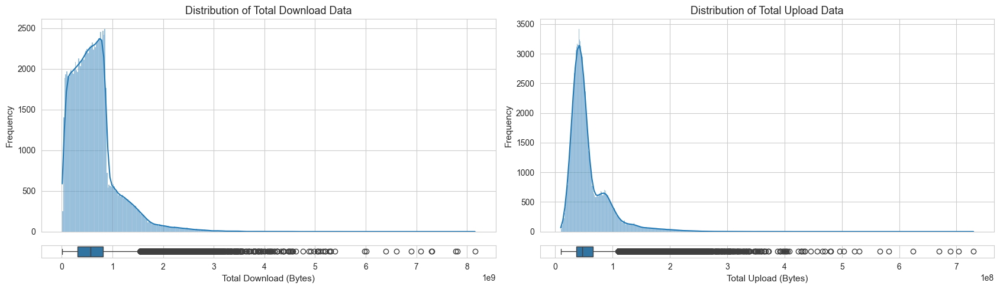

In [100]:
generate_hist_box_plots(
    user_data,
    plot_data=[
        {
            "column": 'Total DL (Bytes)',
            "label": 'Total Download (Bytes)',
            "title": 'Distribution of Total Download Data',
        },
        {
            "column": 'Total UL (Bytes)',
            "label": 'Total Upload (Bytes)',
            "title": 'Distribution of Total Upload Data',
        },

    ],
)


The data reveals that users download significantly more data on average (**634 MB**) compared to uploading (**57 MB**). The maximum download volume (**~8.16 GB**) and upload volume (**~730 MB**) indicate a small subset of heavy users, while the median values suggest that most users download around **571 MB** and upload approximately **47 MB**, highlighting asymmetry in download vs. upload usage patterns.

### Total Data Volume for Each Application

In [101]:
app_columns = [
    ('Social Media', 'Social Media DL (Bytes)', 'Social Media UL (Bytes)'),
    ('Google', 'Google DL (Bytes)', 'Google UL (Bytes)'),
    ('Email', 'Email DL (Bytes)', 'Email UL (Bytes)'),
    ('YouTube', 'Youtube DL (Bytes)', 'Youtube UL (Bytes)'),
    ('Netflix', 'Netflix DL (Bytes)', 'Netflix UL (Bytes)'),
    ('Gaming', 'Gaming DL (Bytes)', 'Gaming UL (Bytes)'),
    ('Other', 'Other DL (Bytes)', 'Other UL (Bytes)')
]

# Calculate total data volume for each application without adding new columns
app_totals = {
    app: df[dl_col].sum() + df[ul_col].sum()
    for app, dl_col, ul_col in app_columns
}

# Convert the results to a Pandas Series for visualization
app_totals_series = pd.Series(app_totals)

# Display the total data volume for each application
print("Total Data Volume (in Bytes) for Each Application:\n")
app_totals_series


Total Data Volume (in Bytes) for Each Application:



Social Media     271185497179
Google          1158266677147
Email            335129340320
YouTube         3359002378304
Netflix         3356972964678
Gaming         63846553124791
Other          63703999349869
dtype: float64

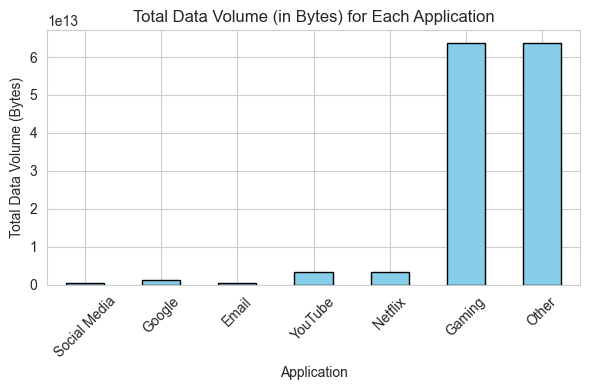

In [102]:
# Bar plot for total data volume per application
app_totals_series.plot(kind='bar', figsize=(6, 4), color='skyblue', edgecolor='black')
plt.title('Total Data Volume (in Bytes) for Each Application')
plt.xlabel('Application')
plt.ylabel('Total Data Volume (Bytes)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


Gaming and Other applications dominate data usage, followed by YouTube and Netflix, highlighting the need to prioritize network optimization for high-demand, data-intensive activities.

## <font color = '#DF9166' size=6>**Exploratory Data Analysis (EDA)**<font/><a class = 'anchor' id = 'eda'/>

###  Variable Transformations

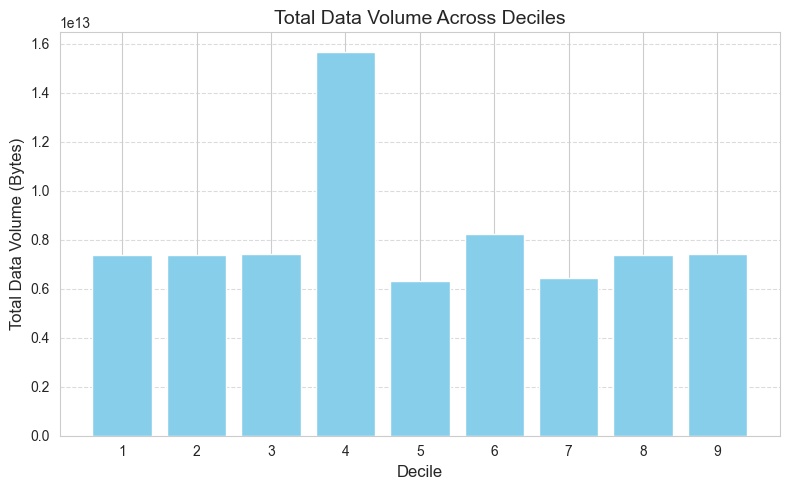

In [103]:
# Create decile classes based on total session duration
df['Decile'] = pd.qcut(df['Dur. (ms)'], 10, labels=False, duplicates='drop') + 1

# Compute total data volume (DL + UL) for each user
df['Total Data (Bytes)'] = df['Total DL (Bytes)'] + df['Total UL (Bytes)']

# Compute the total data volume per decile
decile_data = df.groupby('Decile')['Total Data (Bytes)'].sum().reset_index()

# Visualization using a bar chart
plt.figure(figsize=(8, 5))
plt.bar(decile_data['Decile'], decile_data['Total Data (Bytes)'], color='skyblue')
plt.title("Total Data Volume Across Deciles", fontsize=14)
plt.xlabel("Decile", fontsize=12)
plt.ylabel("Total Data Volume (Bytes)", fontsize=12)
plt.xticks(decile_data['Decile'])
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


### Univariate Analysis

In [104]:
df[NUMERICAL_COLUMNS].describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Start ms,148346,499,289,0,250,499,749,999
End ms,148346,499,288,0,251,500,749,999
Dur. (ms),148346,93335,49201,7142,58374,86399,117296,244832
Avg RTT DL (ms),148346,66,37,0,35,54,106,212
Avg RTT UL (ms),148346,11,9,0,3,7,18,39
Avg Bearer TP DL (kbps),148346,7918,12557,0,43,63,13291,49193
Avg Bearer TP UL (kbps),148346,566,740,0,47,62,1117,2722
TCP DL Retrans. Vol (Bytes),148346,14151811,9724866,2,1414471,21030584,21030584,50343393
TCP UL Retrans. Vol (Bytes),148346,539487,345558,1,65900,771882,771882,1828728
DL TP < 50 Kbps (%),148346,97,5,78,93,100,100,100


The dataset reveals consistent observations across **148,346 entries**. Session times, represented by start and end milliseconds, are uniformly distributed, with session durations averaging **93.34 seconds** but ranging widely, with a significant standard deviation of **~49.20 seconds**, reflecting diverse user activities. Network latency shows faster uplink round-trip times (mean: **11 ms**) than downlink (mean: **66 ms**), with minimal variability (low standard deviations: **37 ms** and **9 ms**, respectively), indicating stable performance overall.

Throughput analysis reveals an average download speed of **~7,918 kbps** and upload speed of **~566 kbps**, with substantial ranges suggesting high-speed scenarios for some users. Total data volumes are dominated by downloads (mean: **~433 MB**), while uploads average **~41 MB**. Streaming and gaming emerge as the most significant traffic categories, with gaming contributing the highest download volumes (mean: **~422 MB**). Social media and email traffic are comparatively lighter, aligning with their less intensive nature.

Activity durations for downloads and uploads average **~462 seconds** and **~375 seconds**, respectively, indicating sustained usage patterns. Throughput percentages show most sessions fall under low-speed categories (**<50 kbps for downloads and <10 kbps for uploads**), highlighting potential for targeted optimization. Retransmissions and outlier metrics point to rare cases of network inefficiencies, warranting further investigation. Overall, the dataset provides actionable insights into optimizing user experience and network resource allocation.

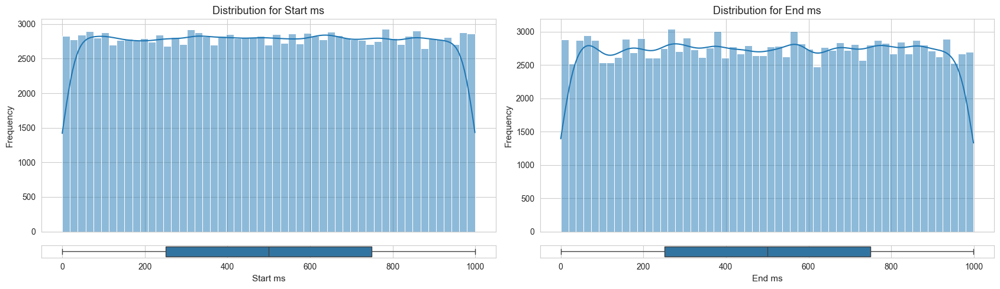

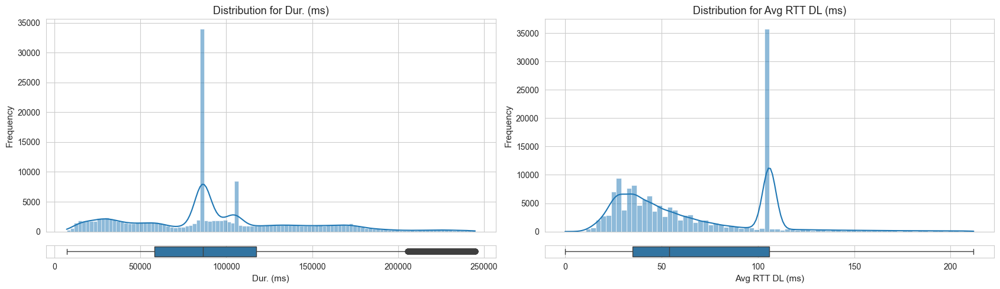

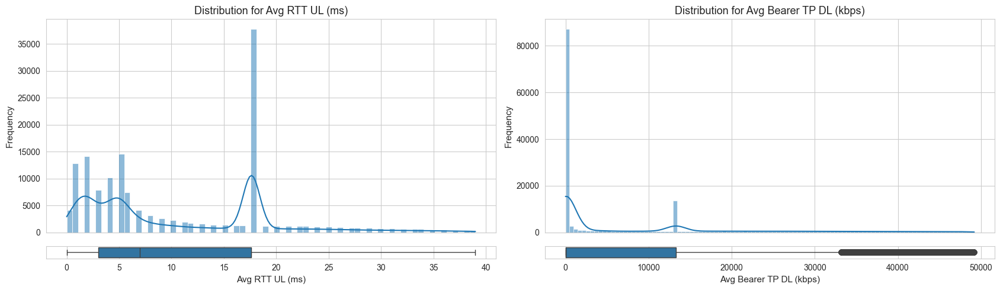

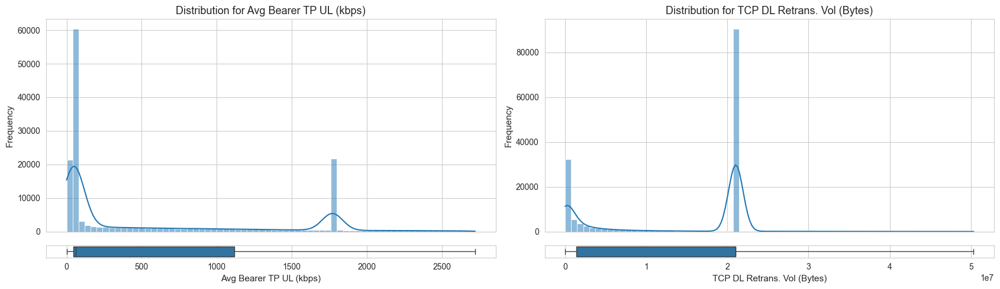

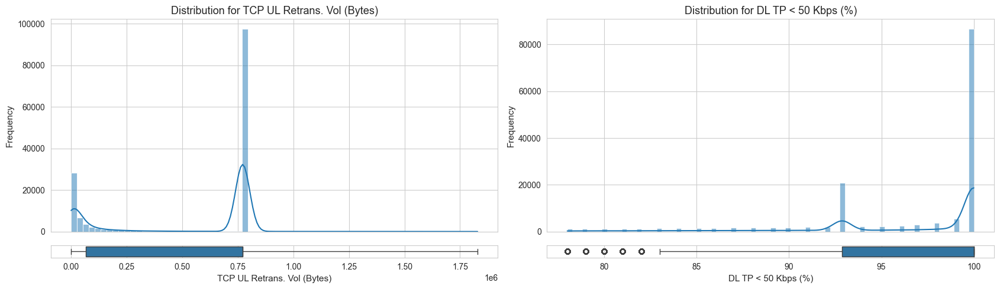

...

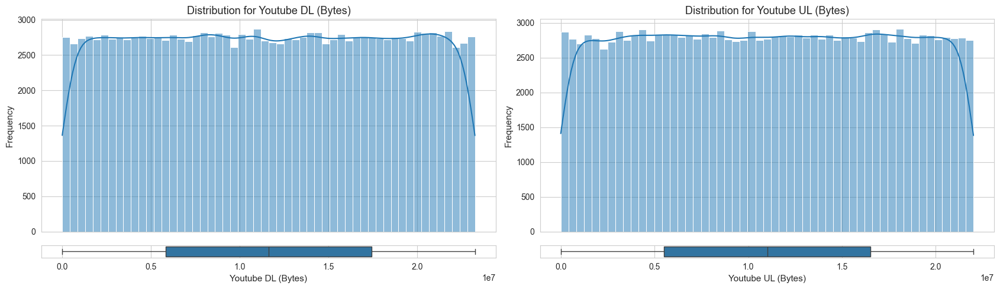

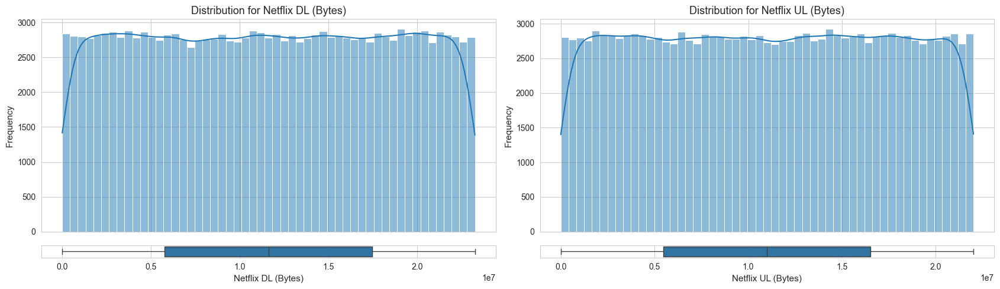

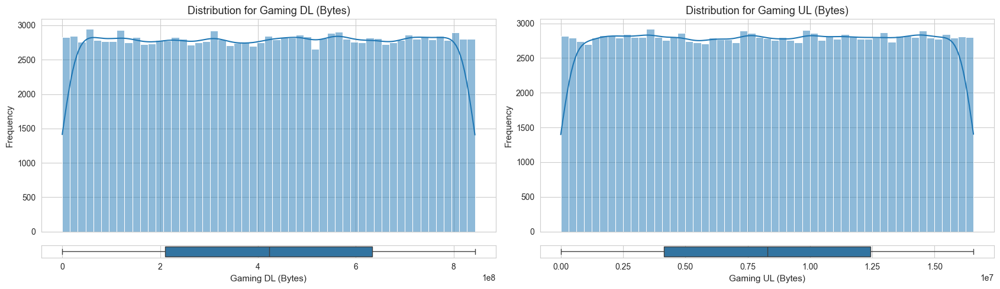

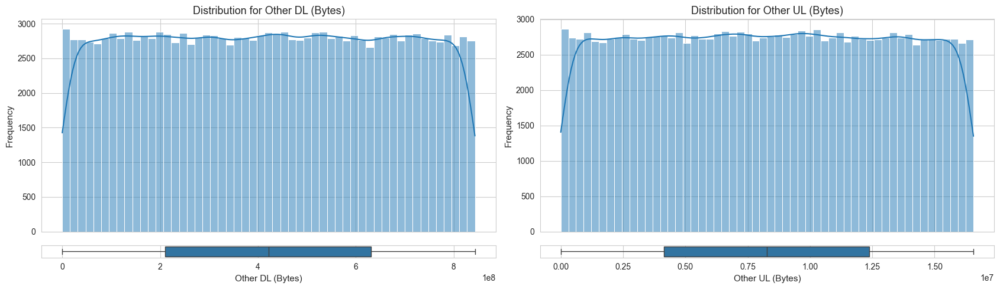

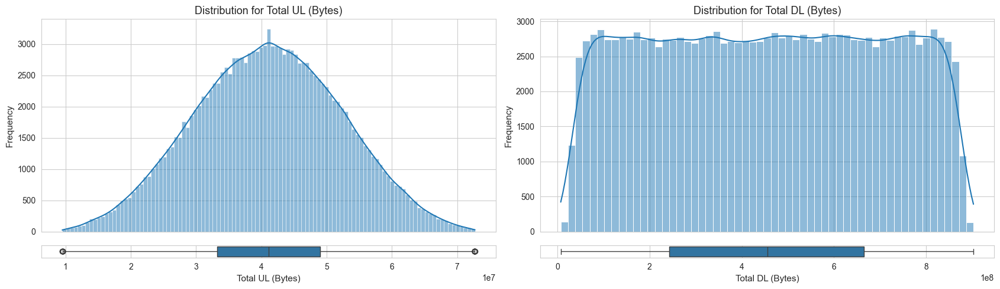

In [110]:

plot_data = [
    {"title": f'Distribution for {col}', "column": col, "label": col} for col in NUMERICAL_COLUMNS
]

for i in range(0, len(plot_data), 2):
    try:
        selected_data = plot_data[i:i + 2]
        generate_hist_box_plots(df, selected_data)
    except:
        continue

**Interpretations**:

Dur. (ms): The histogram shows a right-skewed distribution, indicating most sessions are short-lived with a few extended sessions as outliers. The boxplot confirms significant outliers at the higher end.

Avg RTT DL (ms) & Avg RTT UL (ms): Both histograms show normal-like distributions centered around their means. The boxplots reveal minimal outliers, suggesting stable latency across sessions.

Avg Bearer TP DL (kbps) & Avg Bearer TP UL (kbps): The histograms indicate a highly skewed distribution with most values concentrated near the lower end. Boxplots confirm significant outliers, reflecting varied throughput speeds across users.

Total DL (Bytes) & Total UL (Bytes): Histograms reveal a heavy-tailed distribution, indicating that a few users consume exceptionally high data volumes. Boxplots align, showing these as high outliers.

Gaming DL (Bytes) & Gaming UL (Bytes): The histograms highlight significant variation in gaming data usage, with a majority consuming moderate amounts and some outliers at the upper end. Boxplots confirm these high outliers.

### Bivariate Analysis

In [111]:
df['Total Data Volume (Bytes)'] = df['Total DL (Bytes)'] + df['Total UL (Bytes)']
df['Social Media Total (Bytes)'] = df['Social Media DL (Bytes)'] + df['Social Media UL (Bytes)']
df['Google Total (Bytes)'] = df['Google DL (Bytes)'] + df['Google UL (Bytes)']
df['Youtube Total (Bytes)'] = df['Youtube DL (Bytes)'] + df['Youtube UL (Bytes)']
df['Netflix Total (Bytes)'] = df['Netflix DL (Bytes)'] + df['Netflix UL (Bytes)']
df['Gaming Total (Bytes)'] = df['Gaming DL (Bytes)'] + df['Gaming UL (Bytes)']
df['Email Total (Bytes)'] = df['Email DL (Bytes)'] + df['Email UL (Bytes)']
df['Other Total (Bytes)'] = df['Other DL (Bytes)'] + df['Other UL (Bytes)']

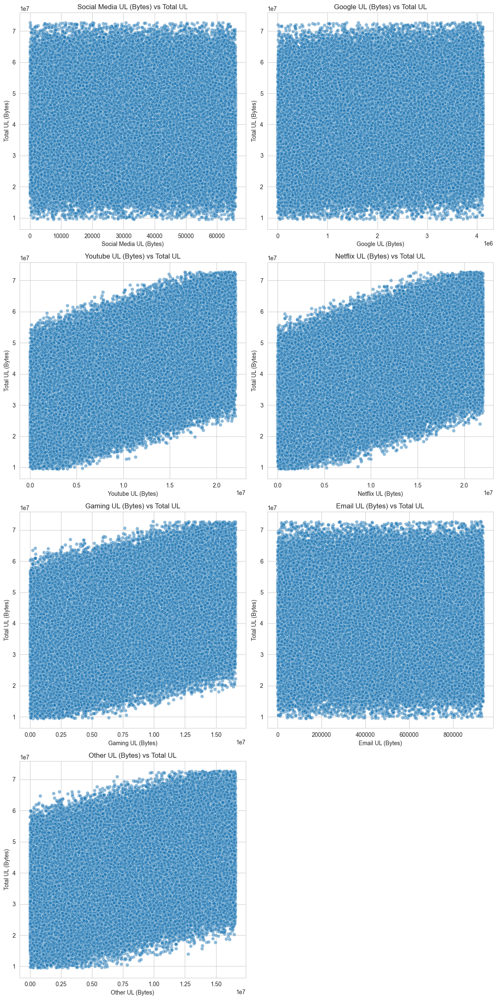

In [112]:
import matplotlib.pyplot as plt
import seaborn as sns

app_columns = [
    "Social Media UL (Bytes)",
    "Google UL (Bytes)",
    "Youtube UL (Bytes)",
    "Netflix UL (Bytes)",
    "Gaming UL (Bytes)",
    "Email UL (Bytes)",
    "Other UL (Bytes)",
]

fig, axes = plt.subplots(4, 2, figsize=(12, 24))
axes = axes.flatten()

# Scatter plots for each application
for i, app in enumerate(app_columns):
    sns.scatterplot(x=df[app], y=df["Total UL (Bytes)"], alpha=0.5, ax=axes[i])
    axes[i].set_title(f"{app} vs Total UL")
    axes[i].set_xlabel(app)
    axes[i].set_ylabel("Total UL (Bytes)")

# Remove the last empty subplot
fig.delaxes(axes[-1])

plt.tight_layout()
plt.show()

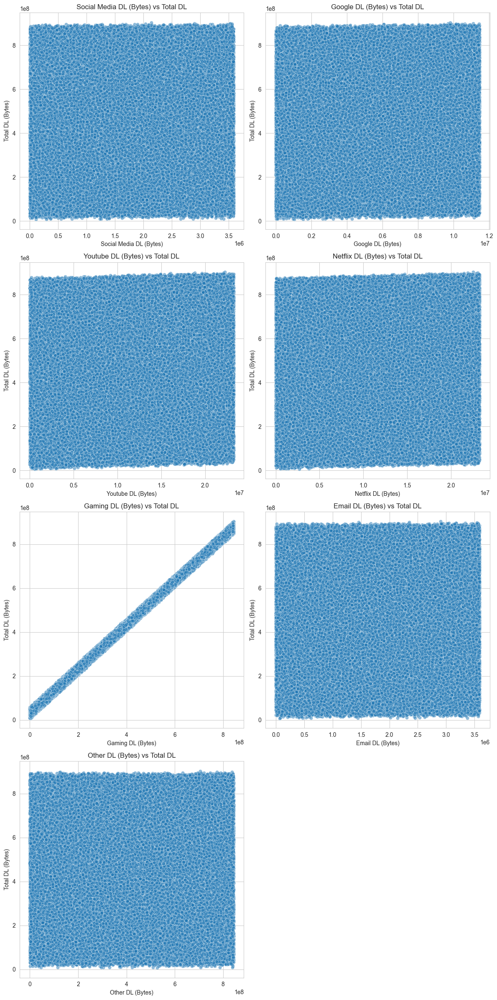

In [113]:
import matplotlib.pyplot as plt
import seaborn as sns

app_columns = [
    "Social Media DL (Bytes)",
    "Google DL (Bytes)",
    "Youtube DL (Bytes)",
    "Netflix DL (Bytes)",
    "Gaming DL (Bytes)",
    "Email DL (Bytes)",
    "Other DL (Bytes)",
]

fig, axes = plt.subplots(4, 2, figsize=(12, 24))
axes = axes.flatten()

# Scatter plots for each application
for i, app in enumerate(app_columns):
    sns.scatterplot(x=df[app], y=df["Total DL (Bytes)"], alpha=0.5, ax=axes[i])
    axes[i].set_title(f"{app} vs Total DL")
    axes[i].set_xlabel(app)
    axes[i].set_ylabel("Total DL (Bytes)")

# Remove the last empty subplot
fig.delaxes(axes[-1])

plt.tight_layout()
plt.show()

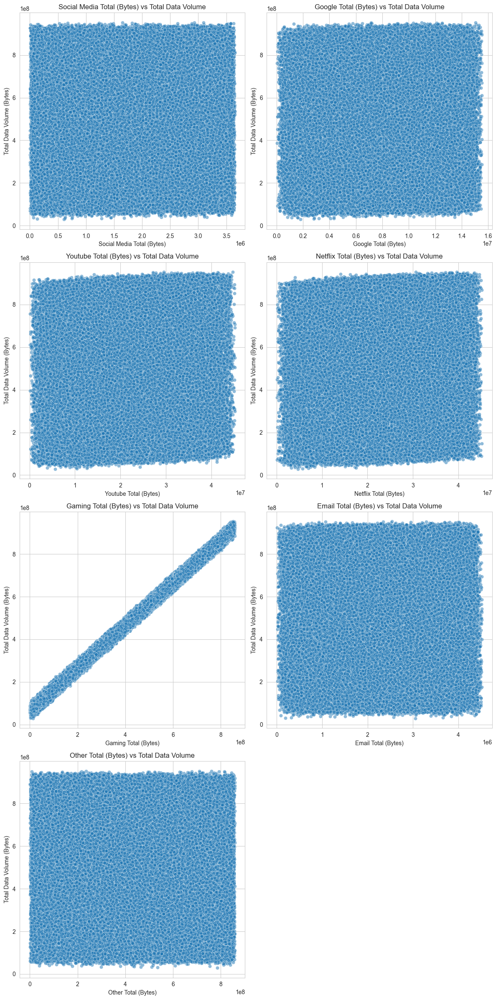

In [114]:
import matplotlib.pyplot as plt
import seaborn as sns

app_columns = [
    "Social Media Total (Bytes)",
    "Google Total (Bytes)",
    "Youtube Total (Bytes)",
    "Netflix Total (Bytes)",
    "Gaming Total (Bytes)",
    "Email Total (Bytes)",
    "Other Total (Bytes)",
]

fig, axes = plt.subplots(4, 2, figsize=(12, 24))
axes = axes.flatten()

# Scatter plots for each application
for i, app in enumerate(app_columns):
    sns.scatterplot(x=df[app], y=df["Total Data Volume (Bytes)"], alpha=0.5, ax=axes[i])
    axes[i].set_title(f"{app} vs Total Data Volume")
    axes[i].set_xlabel(app)
    axes[i].set_ylabel("Total Data Volume (Bytes)")

# Remove the last empty subplot
fig.delaxes(axes[-1])

plt.tight_layout()
plt.show()

### Correlation Analysis

In [115]:
# Select relevant columns
correlation_columns = [
    'Social Media UL (Bytes)', 
    'Google UL (Bytes)', 
    'Email UL (Bytes)', 
    'Youtube UL (Bytes)', 
    'Netflix UL (Bytes)', 
    'Gaming UL (Bytes)', 
    'Other UL (Bytes)', 
    'Total UL (Bytes)'
]

# Compute correlation matrix
correlation_matrix = df[correlation_columns].corr()
correlation_matrix


,Social Media UL (Bytes),Google UL (Bytes),Email UL (Bytes),Youtube UL (Bytes),Netflix UL (Bytes),Gaming UL (Bytes),Other UL (Bytes),Total UL (Bytes)
Social Media UL (Bytes),1,0,-0,-0,-0,0,0,0
Google UL (Bytes),0,1,-0,0,-0,-0,-0,0
Email UL (Bytes),-0,-0,1,-0,0,0,0,0
Youtube UL (Bytes),-0,0,-0,1,0,0,-0,1
Netflix UL (Bytes),-0,-0,0,0,1,-0,-0,1
Gaming UL (Bytes),0,-0,0,0,-0,1,-0,0
Other UL (Bytes),0,-0,0,-0,-0,-0,1,0
Total UL (Bytes),0,0,0,1,1,0,0,1


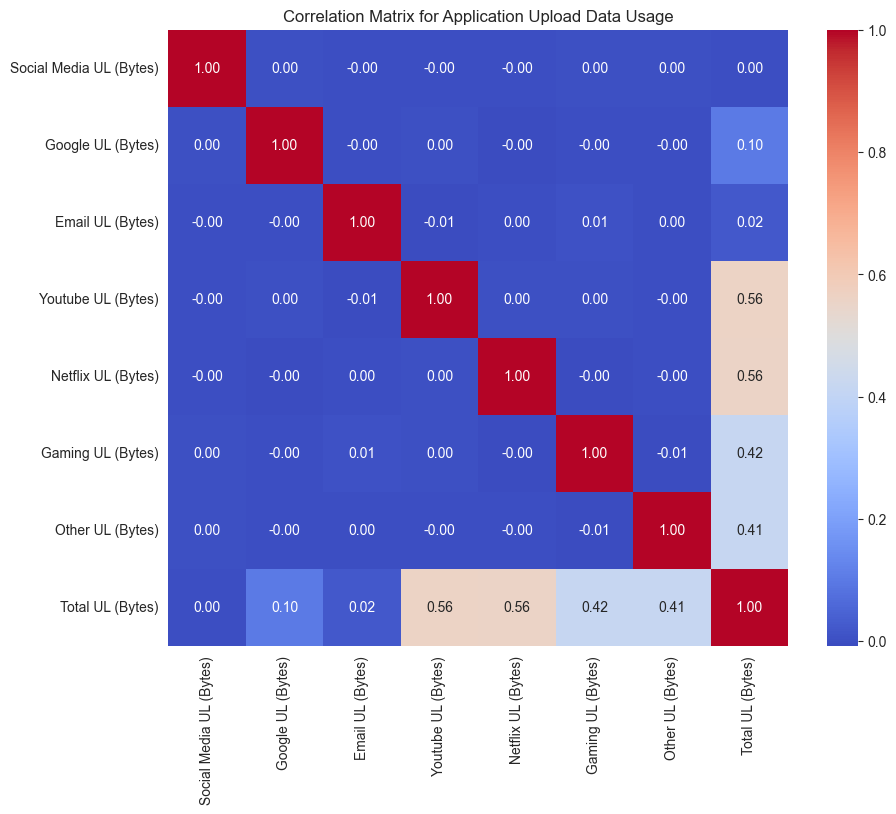

In [116]:
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Matrix for Application Upload Data Usage")
plt.show()


The correlation matrix shows weak correlations between most apps, with Youtube and Netflix strongly linked to Total UL (Bytes). Gaming UL (Bytes) is independent of other applications, indicating distinct upload patterns across platforms.

In [117]:
# Select relevant columns
correlation_columns = [
    'Social Media DL (Bytes)', 
    'Google DL (Bytes)', 
    'Email DL (Bytes)', 
    'Youtube DL (Bytes)', 
    'Netflix DL (Bytes)', 
    'Gaming DL (Bytes)', 
    'Other DL (Bytes)', 
    'Total DL (Bytes)'
]

# Compute correlation matrix
correlation_matrix = df[correlation_columns].corr()
correlation_matrix


,Social Media DL (Bytes),Google DL (Bytes),Email DL (Bytes),Youtube DL (Bytes),Netflix DL (Bytes),Gaming DL (Bytes),Other DL (Bytes),Total DL (Bytes)
Social Media DL (Bytes),1,-0,0,-0,-0,0,0,0
Google DL (Bytes),-0,1,-0,0,0,-0,-0,0
Email DL (Bytes),0,-0,1,0,0,0,-0,0
Youtube DL (Bytes),-0,0,0,1,0,-0,0,0
Netflix DL (Bytes),-0,0,0,0,1,-0,-0,0
Gaming DL (Bytes),0,-0,0,-0,-0,1,-0,1
Other DL (Bytes),0,-0,-0,0,-0,-0,1,-0
Total DL (Bytes),0,0,0,0,0,1,-0,1


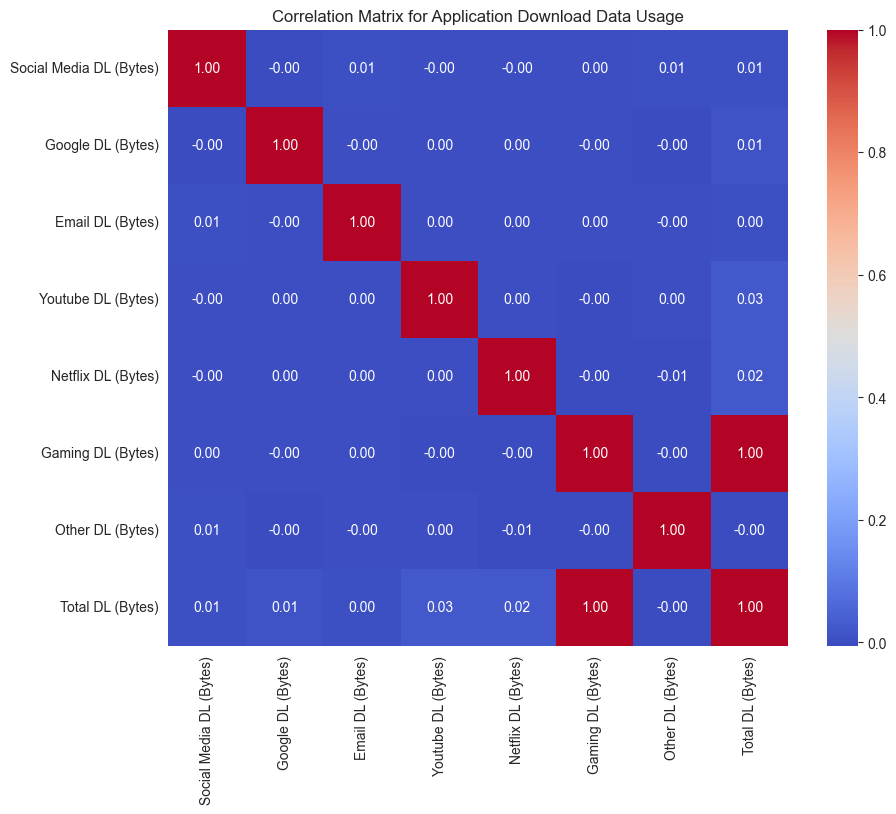

In [118]:
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Matrix for Application Download Data Usage")
plt.show()

The correlation matrix reveals minimal interdependence between most applications' download traffic, with Gaming DL (Bytes) strongly correlated to Total DL (Bytes), indicating that gaming is a major driver of total download traffic. Social Media DL (Bytes) and Google DL (Bytes) show weak correlations with other apps, suggesting independent usage patterns for these platforms.

In [119]:
# Select relevant columns
correlation_columns = [
    'Social Media Total (Bytes)', 
    'Google Total (Bytes)', 
    'Email Total (Bytes)', 
    'Youtube Total (Bytes)', 
    'Netflix Total (Bytes)', 
    'Gaming Total (Bytes)', 
    'Other Total (Bytes)', 
    'Total Data Volume (Bytes)'
]

# Compute correlation matrix
correlation_matrix = df[correlation_columns].corr()
correlation_matrix


,Social Media Total (Bytes),Google Total (Bytes),Email Total (Bytes),Youtube Total (Bytes),Netflix Total (Bytes),Gaming Total (Bytes),Other Total (Bytes),Total Data Volume (Bytes)
Social Media Total (Bytes),1,-0,0,0,0,0,0,0
Google Total (Bytes),-0,1,-0,0,-0,-0,-0,0
Email Total (Bytes),0,-0,1,-0,0,-0,-0,0
Youtube Total (Bytes),0,0,-0,1,0,-0,0,0
Netflix Total (Bytes),0,-0,0,0,1,-0,-0,0
Gaming Total (Bytes),0,-0,-0,-0,-0,1,-0,1
Other Total (Bytes),0,-0,-0,0,-0,-0,1,-0
Total Data Volume (Bytes),0,0,0,0,0,1,-0,1


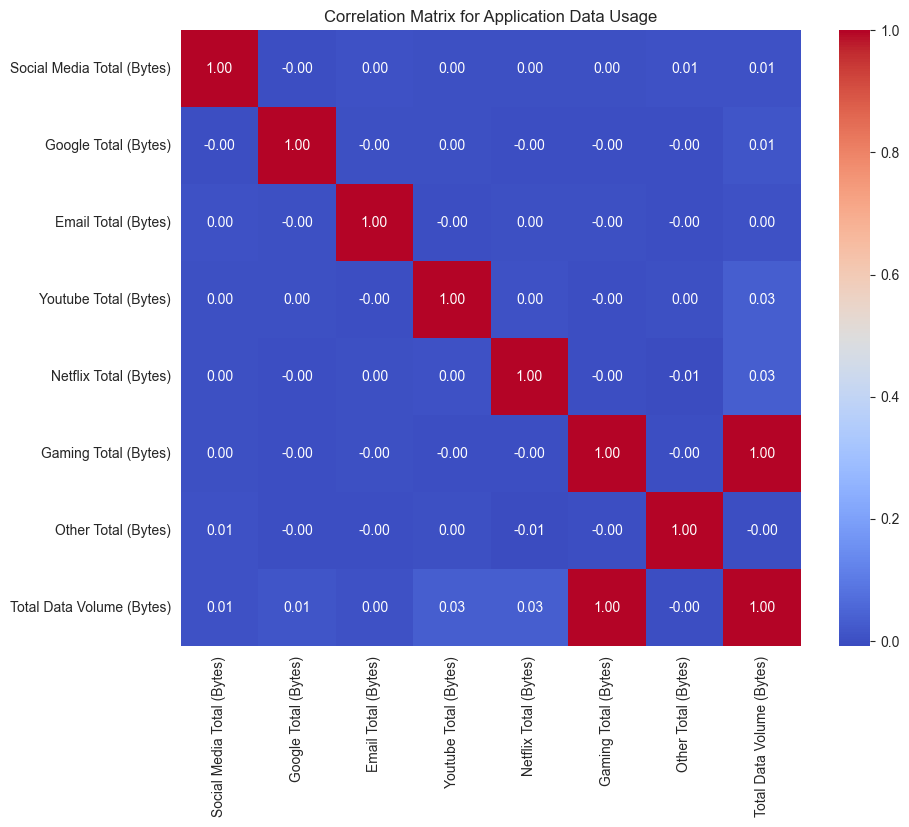

In [120]:
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Matrix for Application Data Usage")
plt.show()


The correlation matrix indicates that Gaming Total (Bytes) is strongly correlated with Total Data Volume (Bytes), suggesting gaming contributes significantly to overall data usage. Other applications like Social Media, Google, and Email show little to no correlation with each other or with the total data volume, implying independent data usage patterns across these platforms.

### Dimensionality Reduction with PCA

In [121]:

# Scale the data for application-related variables
app_columns = [
    'Social Media Total (Bytes)', 
    'Google Total (Bytes)', 
    'Email Total (Bytes)', 
    'Youtube Total (Bytes)', 
    'Netflix Total (Bytes)', 
    'Gaming Total (Bytes)', 
    'Other Total (Bytes)'
]

# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df[app_columns])


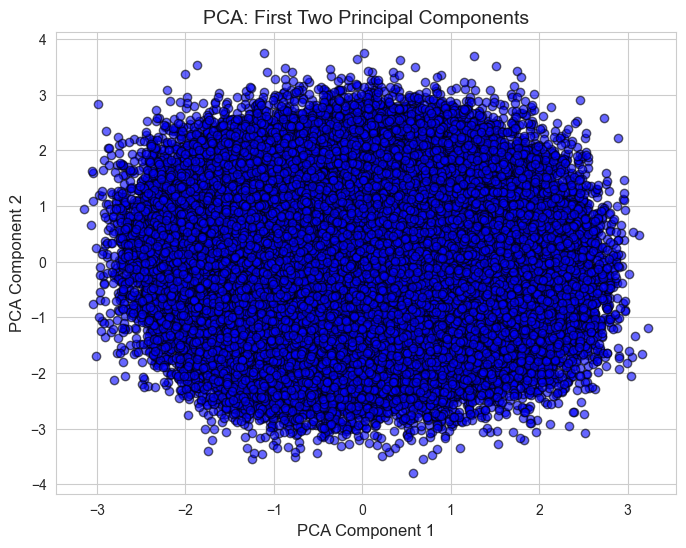

In [125]:
# Perform PCA
pca = PCA(n_components=2)
pca_components = pca.fit_transform(scaled_data)

# Create a scatter plot of the first two principal components
plt.figure(figsize=(8, 6))
plt.scatter(pca_components[:, 0], pca_components[:, 1], alpha=0.6, color='blue', edgecolor='k')
plt.title('PCA: First Two Principal Components', fontsize=14)
plt.xlabel('PCA Component 1', fontsize=12)
plt.ylabel('PCA Component 2', fontsize=12)
plt.grid(True)
plt.show()
